In [ ]:

# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'understanding_cloud_organization:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-competitions-data%2Fkaggle-v2%2F13333%2F862146%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240916%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240916T191453Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D07f0c5358e57eb4f47230cdc936f30134a1f007e12f02f5fe923982c84c0cbc91892e3db32dad00b762f2f099399e9e6c07bbd89ecb523e2e0a6a224e73744cf972a1d4499cb1958445e9f6945948dd39121557a91ef0d1faa7e09eb61adbe659db58fbb452b8145f69477861ca3f2d94640f5f3a88e0f0f72b3335b7da74b1c79b849937e0f891b35c44e76244f50dfbff0003c3dbee0522efad8334cde62e4eb787f2afc16a5c093ebaabc0f2c434f0b07d30298773967537812e15e149e7863a114e0741ae7bb8d4e41b34c50b011ee4615c283210276eec089e4e517aef6556e50c6cbab998c2588bf3ee5a4784729f22e822d4c5db760a2e4a5d9e42d29,haaaaaa:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F5717652%2F9414819%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240916%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240916T191453Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D235f4c208239750b42f888eb546ea33d1e4634c4952bea3d149b215400b2e3814f40a35b85f89fc13f8fe2e6d2c0fd51e7c0ff4fa301c264f955b9c3db0d7fa76493ec367a778839af2c26850c382daada59f9fdc264ef1432faec0dd2b8e830a78241e8d75b161741777bc914ff03838be3100bb7dd77ee5b00b8045371387a34d1a4fc9a3c10f0e5286131ead94ccdcd74ab757a53b7793ca777ccbd20bb54afca66e09584de700aa9fb6834841c201790808656f58d6d317a0e062d3a70baa6ee5b7cc80b8c9074cb9530aa6b35663761e901b2e1cf31fb975cdceca5b4fdcb0f1bff3870fe9b6f279527de801e0c1273ac036f05b21929c24fa3be9abcbf'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


In [ ]:
import tensorflow as tf

if tf.test.gpu_device_name():
    print('GPU is available')
else:
    print('GPU is not available')


GPU is available


In [ ]:
import os
import io
import cv2
import time
import math
import numpy as np
import pandas as pd
import albumentations as A
import matplotlib.pyplot as plt
from PIL import Image

/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.15 (you have 1.4.14). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [ ]:
work_dir = "/kaggle/working/"
data_dir = "../input/understanding_cloud_organization"
train_csv_path = os.path.join(data_dir,'train.csv')
test_csv_path = os.path.join(data_dir, "sample_submission.csv")
train_image_path = os.path.join(data_dir, 'train_images')
test_image_path = os.path.join(data_dir, 'test_images')

In [ ]:
class COLOR:
    PURPLE = '\033[95m'
    CYAN = '\033[96m'
    DARKCYAN = '\033[36m'
    BLUE = '\033[94m'
    GREEN = '\033[92m'
    YELLOW = '\033[93m'
    RED = '\033[91m'
    BOLD = '\033[1m'
    UNDERLINE = '\033[4m'
    END = '\033[0m'

In [ ]:
train_df = pd.read_csv(train_csv_path).fillna(-1)
train_df.head()

,Image_Label,EncodedPixels
0,0011165.jpg_Fish,264918 937 266318 937 267718 937 269118 937 27...
1,0011165.jpg_Flower,1355565 1002 1356965 1002 1358365 1002 1359765...
2,0011165.jpg_Gravel,-1
3,0011165.jpg_Sugar,-1
4,002be4f.jpg_Fish,233813 878 235213 878 236613 878 238010 881 23...


In [ ]:
train_df['Image_Id'] = train_df['Image_Label'].apply(lambda x: x.split('_')[0])
train_df['Label'] = train_df['Image_Label'].apply(lambda x: x.split('_')[1])
train_df.head()

,Image_Label,EncodedPixels,Image_Id,Label
0,0011165.jpg_Fish,264918 937 266318 937 267718 937 269118 937 27...,0011165.jpg,Fish
1,0011165.jpg_Flower,1355565 1002 1356965 1002 1358365 1002 1359765...,0011165.jpg,Flower
2,0011165.jpg_Gravel,-1,0011165.jpg,Gravel
3,0011165.jpg_Sugar,-1,0011165.jpg,Sugar
4,002be4f.jpg_Fish,233813 878 235213 878 236613 878 238010 881 23...,002be4f.jpg,Fish


In [ ]:
train_df['Label_EncodedPixels'] = train_df.apply(lambda row: (row['Label'], row['EncodedPixels']), axis = 1)
train_df.head()

,Image_Label,EncodedPixels,Image_Id,Label,Label_EncodedPixels
0,0011165.jpg_Fish,264918 937 266318 937 267718 937 269118 937 27...,0011165.jpg,Fish,"(Fish, 264918 937 266318 937 267718 937 269118..."
1,0011165.jpg_Flower,1355565 1002 1356965 1002 1358365 1002 1359765...,0011165.jpg,Flower,"(Flower, 1355565 1002 1356965 1002 1358365 100..."
2,0011165.jpg_Gravel,-1,0011165.jpg,Gravel,"(Gravel, -1)"
3,0011165.jpg_Sugar,-1,0011165.jpg,Sugar,"(Sugar, -1)"
4,002be4f.jpg_Fish,233813 878 235213 878 236613 878 238010 881 23...,002be4f.jpg,Fish,"(Fish, 233813 878 235213 878 236613 878 238010..."


In [ ]:
grouped_EncodedPixels = train_df.groupby('Image_Id')['Label_EncodedPixels'].apply(list)
grouped_EncodedPixels.head()
grouped_EncodedPixels.info()

<class 'pandas.core.series.Series'>
Index: 5546 entries, 0011165.jpg to ffea4f4.jpg
Series name: Label_EncodedPixels
Non-Null Count  Dtype 
--------------  ----- 
5546 non-null   object
dtypes: object(1)
memory usage: 86.7+ KB


In [ ]:
train_df = grouped_EncodedPixels.to_frame().reset_index()
train_df.head()

,Image_Id,Label_EncodedPixels
0,0011165.jpg,"[(Fish, 264918 937 266318 937 267718 937 26911..."
1,002be4f.jpg,"[(Fish, 233813 878 235213 878 236613 878 23801..."
2,0031ae9.jpg,"[(Fish, 3510 690 4910 690 6310 690 7710 690 91..."
3,0035239.jpg,"[(Fish, -1), (Flower, 100812 462 102212 462 10..."
4,003994e.jpg,"[(Fish, 2367966 18 2367985 2 2367993 8 2368002..."


In [ ]:
labels = ['Fish', 'Flower', 'Gravel', 'Sugar']

for label in labels:
    train_df = train_df.assign(**{label: 0})
for index, row in train_df.iterrows():
    for item in row['Label_EncodedPixels']:
        label, value = item
        if value == -1:
            bool_value = 0
        else:
            bool_value = 1
        train_df.loc[index, label] = bool_value

train_df['classes'] = train_df.apply(lambda row: [col for col in labels if row[col] == 1], axis=1)

train_df.head()

,Image_Id,Label_EncodedPixels,Fish,Flower,Gravel,Sugar,classes
0,0011165.jpg,"[(Fish, 264918 937 266318 937 267718 937 26911...",1,1,0,0,"[Fish, Flower]"
1,002be4f.jpg,"[(Fish, 233813 878 235213 878 236613 878 23801...",1,1,0,1,"[Fish, Flower, Sugar]"
2,0031ae9.jpg,"[(Fish, 3510 690 4910 690 6310 690 7710 690 91...",1,1,0,1,"[Fish, Flower, Sugar]"
3,0035239.jpg,"[(Fish, -1), (Flower, 100812 462 102212 462 10...",0,1,1,0,"[Flower, Gravel]"
4,003994e.jpg,"[(Fish, 2367966 18 2367985 2 2367993 8 2368002...",1,0,1,1,"[Fish, Gravel, Sugar]"


In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5546 entries, 0 to 5545
Data columns (total 7 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Image_Id             5546 non-null   object
 1   Label_EncodedPixels  5546 non-null   object
 2   Fish                 5546 non-null   int64 
 3   Flower               5546 non-null   int64 
 4   Gravel               5546 non-null   int64 
 5   Sugar                5546 non-null   int64 
 6   classes              5546 non-null   object
dtypes: int64(4), object(3)
memory usage: 303.4+ KB


In [ ]:
# printing out indexes (in dataframe) of some images having all 4 types of mask
for ix,item in enumerate(train_df['Label_EncodedPixels'][:100]):
    c1=item[0][-1]!=-1
    c2=item[1][-1]!=-1
    c3=item[2][-1]!=-1
    c4=item[3][-1]!=-1
    if c1 and c2 and c3 and c4:
        print(ix)

18
28
72
74
85
91


In [ ]:
train_df.loc[18]["Image_Id"]

'00dec6a.jpg'

In [ ]:
# printing out indexes (in image dir) of some images having all 4 types of mask
for ix,item in enumerate(os.listdir(train_image_path)):
    if item == train_df.loc[18]["Image_Id"]:
        print(ix)

3446


In [ ]:
for j,item in enumerate(train_df['Label_EncodedPixels'][:100]):
    c1=item[0][-1]!=-1
    c2=item[1][-1]!=-1
    c3=item[2][-1]!=-1
    c4=item[3][-1]!=-1
    if c1 and c2 and c3 and c4:
        for ix,item in enumerate(os.listdir(train_image_path)):
            if item == train_df.loc[j]["Image_Id"]:
                print(ix)

3446
5390
38
4167
4184
115


In [ ]:
INDEX = 5390

In [ ]:
indexes =  [0, 1, 2, 3]
labels = ['Fish', 'Flower', 'Gravel', 'Sugar']
colors = ['maroon', 'darkblue', 'purple','teal']
colormaps = ['PuRd_r', 'Blues_r', 'Purples_r','winter_r']
rgb_colors = [(56, 255, 255),(255, 70, 90),(48, 255, 99),(255, 255, 102)]

label_to_idx = dict(zip(labels,indexes))
idx_to_label = dict(zip(indexes,labels))

label_to_color = dict(zip(labels,colors))
idx_to_color = dict(zip(indexes,colors))

label_to_rgb_color =  dict(zip(labels,rgb_colors))
idx_to_rgb_color = dict(zip(indexes,rgb_colors))

label_to_colormap = dict(zip(labels,colormaps))
idx_to_colormap = dict(zip(indexes,colormaps))

In [ ]:
def count_nonzero_pixel_from_rle(rle_string, height, width):
    """
    Counts non-zero pixels in a RLE-encoded mask without decoding.

    Args:
        rle_string (str): RLE-encoded mask string.
        height (int): Height of the mask.
        width (int): Width of the mask.

    Returns:
        int: Number of non-zero pixels in the mask.
    """

    if rle_string == -1:
        return 0  # Empty mask

    nonzero_count = 0
    rle_numbers = [int(num_string) for num_string in rle_string.split(' ')]
    rle_pairs = np.array(rle_numbers).reshape(-1, 2)

    for index, length in rle_pairs:
        if length > 0:  # Only count non-zero runs
            nonzero_count += length

    return nonzero_count

In [ ]:
%%time

class_wise_pixel_count = {
    "Fish":0,
    "Flower":0,
    "Gravel":0,
    "Sugar":0
}

img_width = 2100
img_height = 1400

fish_count = 0
flower_count = 0
gravel_count = 0
sugar_count = 0

for ix, item in train_df.iterrows():
    rle = item["Label_EncodedPixels"]
    class_wise_pixel_count["Fish"] += count_nonzero_pixel_from_rle(rle[0][1], img_height, img_width)
    class_wise_pixel_count["Flower"] += count_nonzero_pixel_from_rle(rle[1][1], img_height, img_width)
    class_wise_pixel_count["Gravel"] += count_nonzero_pixel_from_rle(rle[2][1], img_height, img_width)
    class_wise_pixel_count["Sugar"] += count_nonzero_pixel_from_rle(rle[3][1], img_height, img_width)


print(class_wise_pixel_count)


{'Fish': 2409638218, 'Flower': 2256969359, 'Gravel': 2464030323, 'Sugar': 2681738657}
CPU times: user 38.8 s, sys: 14.4 ms, total: 38.9 s
Wall time: 38.8 s


Observation: The pixel distribution of the classes is somewhat balanced.


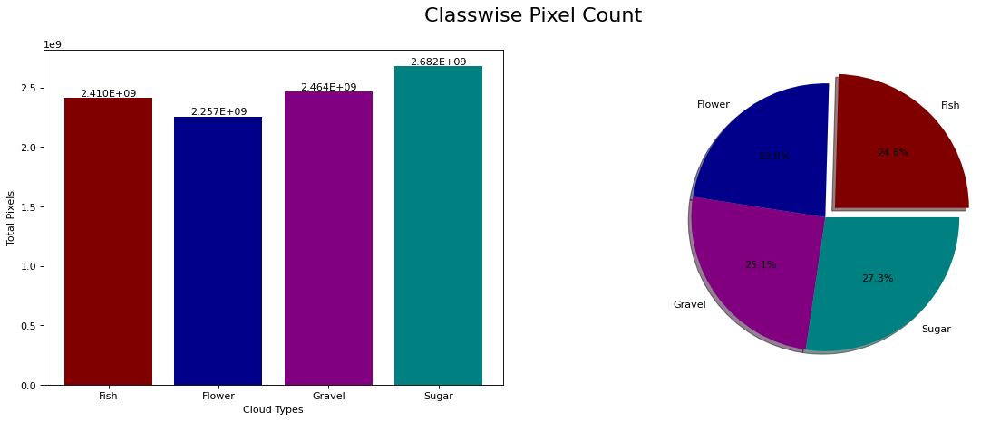

In [ ]:
fig = plt.figure(num=None, figsize=(18, 6), dpi=80, facecolor='w', edgecolor='k')
fig.suptitle('Classwise Pixel Count', fontsize=20)
fig.tight_layout();

ax = plt.subplot(1,2,1)
bar = plt.bar(class_wise_pixel_count.keys(), class_wise_pixel_count.values(), color=colors);
for rect in bar:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2, height, '%.3E' % height,
             ha='center', va='bottom',fontsize=10)
plt.xlabel("Cloud Types");
plt.ylabel("Total Pixels");

ax = plt.subplot(1,2,2)
plt.pie(class_wise_pixel_count.values(),
        labels=class_wise_pixel_count.keys(),
        autopct='%1.1f%%',
        explode=[0.1,0,0,0],
        colors=colors,
        shadow=True,
        startangle=0);

print(COLOR.BOLD +COLOR.GREEN+ "Observation: The pixel distribution of the classes is somewhat balanced." + COLOR.END)

In [ ]:
total_pixels = img_height*img_width*len(train_df)
mask_pixels = sum(class_wise_pixel_count.values())

pixel_distribution = {"Background":(total_pixels-mask_pixels)/total_pixels*100,
                       "Fish":class_wise_pixel_count["Fish"]/total_pixels*100,
                       "Flower":class_wise_pixel_count["Flower"]/total_pixels*100,
                       "Gravel":class_wise_pixel_count["Gravel"]/total_pixels*100,
                       "Sugar":class_wise_pixel_count["Sugar"]/total_pixels*100,
                       }

print(pixel_distribution)

{'Background': 39.82071679411036, 'Fish': 14.778305734843523, 'Flower': 13.841987968285041, 'Gravel': 15.111892391648329, 'Sugar': 16.447097111112747}


Observation: The pixel distribution of the overall dataset is not balanced,
             most of the pixels does not have any associated label.


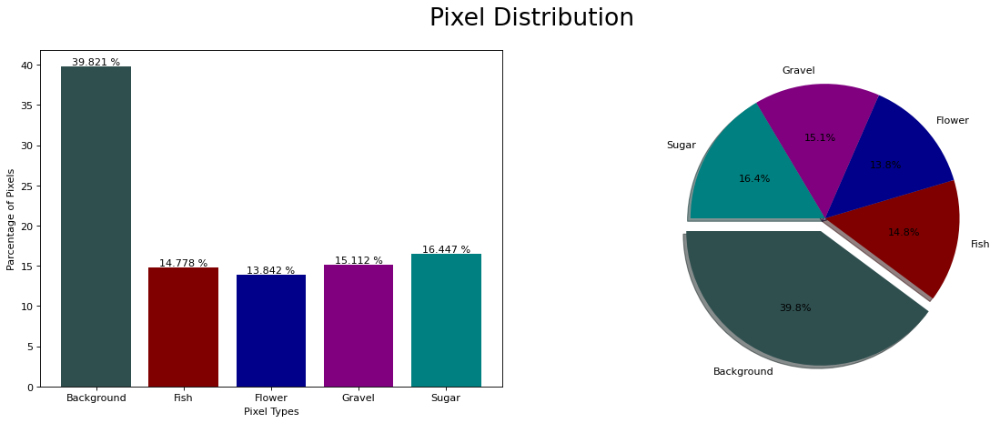

In [ ]:
fig = plt.figure(num=None, figsize=(18, 6), dpi=80, facecolor='w', edgecolor='k')
fig.suptitle('Pixel Distribution', fontsize=24)
fig.tight_layout();

ax = plt.subplot(1,2,1)
bar = plt.bar(pixel_distribution.keys(), pixel_distribution.values(), color=["darkslategrey"]+colors);
for rect in bar:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2, height, '%.3f %%' % height,
             ha='center', va='bottom',fontsize=10)

plt.xlabel("Pixel Types");
plt.ylabel("Parcentage of Pixels");

ax = plt.subplot(1,2,2)
plt.pie(pixel_distribution.values(),
        labels=pixel_distribution.keys(),
        autopct='%1.1f%%',
        explode=[0.1,0,0,0,0],
        shadow=True,
        colors=["darkslategrey"]+colors,
        startangle=180);


comment = '''Observation: The pixel distribution of the overall dataset is not balanced,
             most of the pixels does not have any associated label.'''

print(COLOR.BOLD +COLOR.GREEN+ comment + COLOR.END)

Observation: The Dataset is somewhat balanced for classifcation tasks.


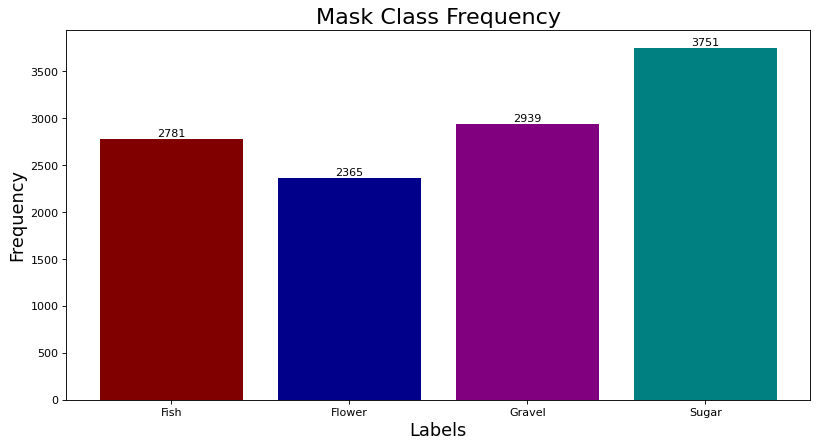

In [ ]:
fig = plt.figure(num=None, figsize=(12, 6), dpi=80, facecolor='w', edgecolor='k')
fig.tight_layout();

class_frequency = dict(train_df[labels].sum())
bar = plt.bar(class_frequency.keys(),class_frequency.values(), color=colors)
for rect in bar:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2, height, height,
             ha='center', va='bottom',fontsize=10)

plt.xlabel("Labels",fontsize=16);
plt.ylabel('Frequency',fontsize=16)
plt.title("Mask Class Frequency",fontsize=20)

print(COLOR.BOLD +COLOR.GREEN+ "Observation: The Dataset is somewhat balanced for classifcation tasks." + COLOR.END)

Observation: Most of the images have 2 labels.


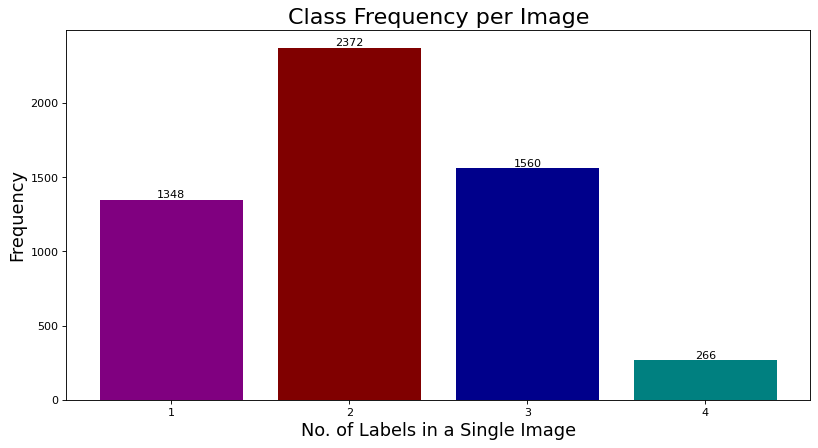

In [ ]:
fig = plt.figure(num=None, figsize=(12, 6), dpi=80, facecolor='w', edgecolor='k')
fig.tight_layout();

class_frequency_per_image = dict(train_df["classes"].apply(len).value_counts())

bar = plt.bar(class_frequency_per_image.keys(), class_frequency_per_image.values(), color=colors);
for rect in bar:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2, height, height,
             ha='center', va='bottom',fontsize=10)
plt.xlabel("No. of Labels in a Single Image",fontsize=16);
plt.xticks(ticks=[1,2,3,4]);
plt.ylabel("Frequency",fontsize=16);
plt.title("Class Frequency per Image",fontsize=20);

print(COLOR.BOLD +COLOR.GREEN+ "Observation: Most of the images have 2 labels." + COLOR.END)

Observation: Avarage area(pixel count) for each mask are somewhat close.


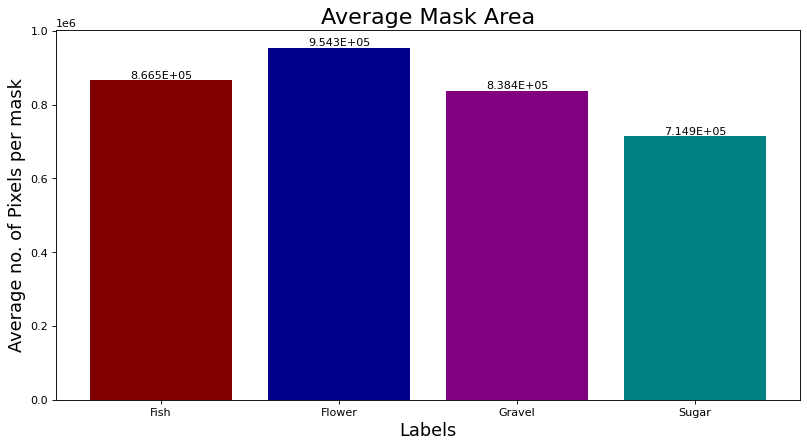

In [ ]:
#Avarage Area per mask
avarage_mask_area = dict()

for key in class_frequency.keys():
    avarage_mask_area[key] = class_wise_pixel_count[key]//class_frequency[key]

fig = plt.figure(num=None, figsize=(12, 6), dpi=80, facecolor='w', edgecolor='k')
fig.tight_layout();

bar = plt.bar(avarage_mask_area.keys(), avarage_mask_area.values(), color=colors);
for rect in bar:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2, height, '%.3E'%height,
             ha='center', va='bottom',fontsize=10)

plt.xlabel("Labels",fontsize=16);
plt.ylabel("Average no. of Pixels per mask",fontsize=16);
plt.title("Average Mask Area",fontsize=20);

print(COLOR.BOLD +COLOR.GREEN+ "Observation: Avarage area(pixel count) for each mask are somewhat close." + COLOR.END)

In [ ]:
from itertools import combinations
classes = labels
combinations_list = list(combinations(classes, 1)) + list(combinations(classes, 2)) + list(combinations(classes, 3)) + list(combinations(classes, 4))

label_counts = {}
for combination in combinations_list:
    count = train_df[train_df["classes"].apply(lambda x: set(combination).issubset(x))].shape[0]
    label_counts[tuple(combination)] = count


def remove_chars_iter(subj,):
    chars = [")","(","'"]
    subj = str(subj)
    sc = set(chars)
    return ''.join([c for c in subj if c not in sc]);

#remove_chars_iter(list(label_counts.keys())[5])


label_counts

{('Fish',): 2781,
 ('Flower',): 2365,
 ('Gravel',): 2939,
 ('Sugar',): 3751,
 ('Fish', 'Flower'): 1045,
 ('Fish', 'Gravel'): 1423,
 ('Fish', 'Sugar'): 1782,
 ('Flower', 'Gravel'): 926,
 ('Flower', 'Sugar'): 1405,
 ('Gravel', 'Sugar'): 2067,
 ('Fish', 'Flower', 'Gravel'): 423,
 ('Fish', 'Flower', 'Sugar'): 594,
 ('Fish', 'Gravel', 'Sugar'): 992,
 ('Flower', 'Gravel', 'Sugar'): 615,
 ('Fish', 'Flower', 'Gravel', 'Sugar'): 266}

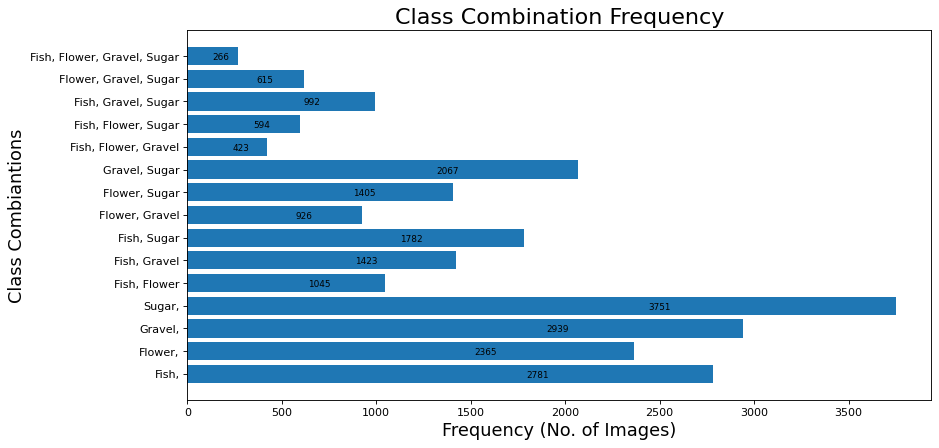

In [ ]:
fig = plt.figure(num=None, figsize=(12, 6), dpi=80, facecolor='w', edgecolor='k')
fig.tight_layout();


bar = plt.barh(list(map(remove_chars_iter,label_counts.keys())), label_counts.values());

for rect in bar:
    width = rect.get_width()
    plt.text(width-width/3, rect.get_y() + rect.get_height()/5, width,
             ha='center', va='bottom',fontsize=8)

plt.xlabel("Frequency (No. of Images)", fontsize=16);
plt.ylabel("Class Combiantions", fontsize=16);
plt.title("Class Combination Frequency", fontsize=20);

In [ ]:
def batchDataLoader(image_dir,img_w= 512, img_h=512, num_channel =4, Batch_Size=32):

    while True:
        k=0
        image_ids = os.listdir(image_dir)
        num_batches = math.ceil(len(image_ids)/Batch_Size)

        for batch_no in range(1,num_batches+1):
            if batch_no < num_batches:
                batch_size = Batch_Size
                batch_image_ids = image_ids[k:k+batch_size]
                image_batch = np.zeros((batch_size, img_h, img_w, num_channel),dtype=np.uint8)
                for i in range(batch_size):
                    path = os.path.join(image_dir, image_ids[i])
                    img = cv2.imread(path)
                    img =  cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    image_batch[i] = img
            # for the last batch which could be fractional
            if batch_no == num_batches:
                batch_image_ids = image_ids[k:]
                batch_size = len(batch_image_ids)
                image_batch = np.zeros((batch_size, img_h, img_w, num_channel),dtype=np.uint8)
                for i in range(batch_size):
                    path = os.path.join(image_dir, image_ids[i])
                    img = cv2.imread(path)
                    img =  cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    image_batch[i] = img

            k = k+batch_size
            print(f"batch_no = {batch_no}")
            yield image_batch

In [ ]:
img_width = 2100
img_height = 1400
num_channel = 3
BATCH_SIZE = 32
current_batch = batchDataLoader(train_image_path,img_width,img_height, num_channel, BATCH_SIZE)

batch_no = 1
(32, 1400, 2100, 3)


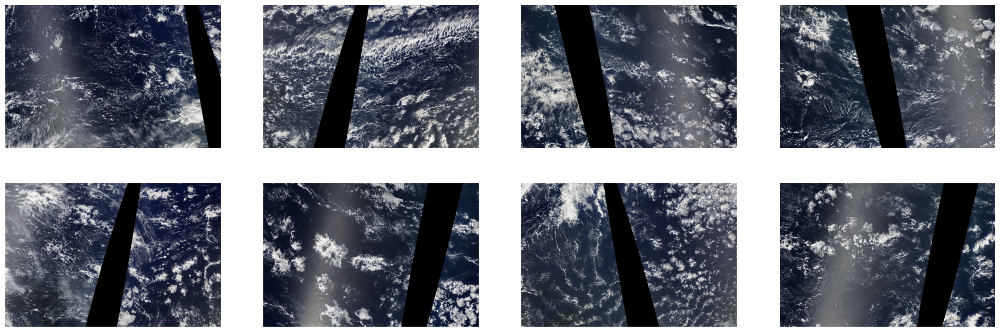

In [ ]:
images = next(current_batch)
print(images.shape)
plt.figure(figsize=(24,8))
for i in range(8):
    ax = plt.subplot(2,4, i+1)
    plt.imshow(images[i])
    plt.axis("off");

In [ ]:
def rle_to_mask(rle_string, height, width):
    '''
    convert RLE(run length encoding) string to numpy array

    Parameters:
    rle_string (str): string of rle encoded mask
    height (int): height of the mask
    width (int): width of the mask

    Returns:
    numpy.array: numpy array of the mask
    '''

    rows, cols = height, width

    if rle_string == -1:
        return np.zeros((height,width))
    else:
        rle_numbers = [int(num_string) for num_string in rle_string.split(' ')]
        rle_pairs = np.array(rle_numbers).reshape(-1,2)
        img = np.zeros(rows*cols, dtype=np.uint8)
        for index, length in rle_pairs:
            index -= 1
            img[index:index+length] = 255
        img = img.reshape(cols,rows)
        img = img.T
        img = img/255.0
        return img

(256, 384)
[0 1]
[58 34]


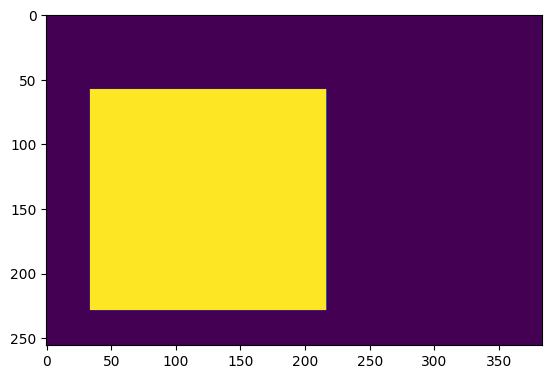

In [ ]:
image_id = '0011165.jpg'
path = os.path.join(train_image_path,image_id)
img = cv2.imread(path)
img =  cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
rle = list(train_df[train_df['Image_Id'] == image_id]['Label_EncodedPixels'])[0][0][1]

m = rle_to_mask(rle,img_height,img_width)
m = cv2.resize(m, (384,256),interpolation=cv2.INTER_LINEAR)
m = (m>0).astype(int)
plt.imshow(m)
print(m.shape)
print(np.unique(m))
print(np.argwhere(m==1)[0])

In [ ]:
def get_masks_by_img_id(dataframe, image_id):
    masks = np.zeros((img_height,img_width,4))
    rle_masks = list(dataframe[dataframe['Image_Id'] == image_id]['Label_EncodedPixels'])[0]
    fish_mask = rle_to_mask(rle_masks[0][1], img_height, img_width)
    flower_mask = rle_to_mask(rle_masks[1][1], img_height, img_width)
    gravel_mask = rle_to_mask(rle_masks[2][1], img_height, img_width)
    sugar_mask = rle_to_mask(rle_masks[3][1], img_height, img_width)
    mask_list = [fish_mask,flower_mask,gravel_mask,sugar_mask]
    for ix, mask in enumerate(mask_list):
        masks[:,:,ix] = mask
    return masks

In [ ]:
image_id = os.listdir(train_image_path)[1]
#image_id = 'f516a20.jpg'
masks = get_masks_by_img_id(train_df, image_id)
masks.shape

(1400, 2100, 4)

015aa06.jpg


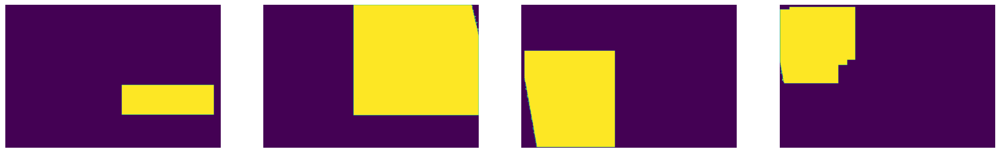

In [ ]:
image_id = os.listdir(train_image_path)[INDEX]
#image_id = 'f516a20.jpg'
masks = get_masks_by_img_id(train_df, image_id)
print(image_id)
plt.figure(figsize=(24,4))
for ix in range(masks.shape[-1]):
    ax = plt.subplot(1,4, ix+1)
    plt.imshow(masks[:,:,ix],cmap=None)
    plt.axis("off");

In [ ]:
from matplotlib import font_manager
font_prop = font_manager.FontProperties(size=16,weight="semibold",stretch="condensed")

def draw_label_on_mask(mask, label, obj=plt):
    '''
    Function to add labels to the image.
    '''
    if np.sum(mask) > 0:
        y,x = 0,0
        y,x = np.argwhere(mask==1)[0]
        y,x = y+50,x+20
        obj.text(x,y,label,color='white',fontproperties=font_prop)
    return None

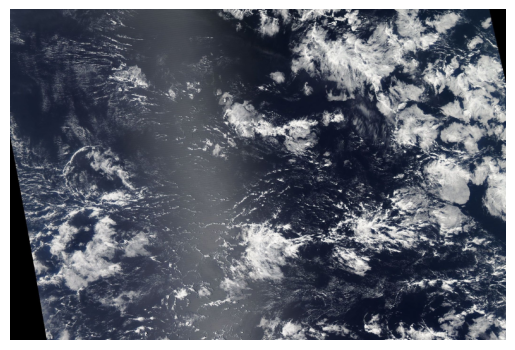

In [ ]:
image_id = os.listdir(train_image_path)[INDEX]
path = os.path.join(train_image_path,image_id)
img = cv2.imread(path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#img = cv2.resize(img,(384,256))
img = img.astype(np.float32)
img = img/255.0
dpi = 100
#plt.figure(figsize=(img_width/dpi, img_height/dpi), dpi=dpi)
#img -= img.mean()
#img /= img.std()
#standarization changes the color
#print(img.shape)
plt.imshow(img);
plt.axis('off');
#plt.savefig(f"{work_dir}clouds.png",transparent=True,bbox_inches='tight', pad_inches=0)

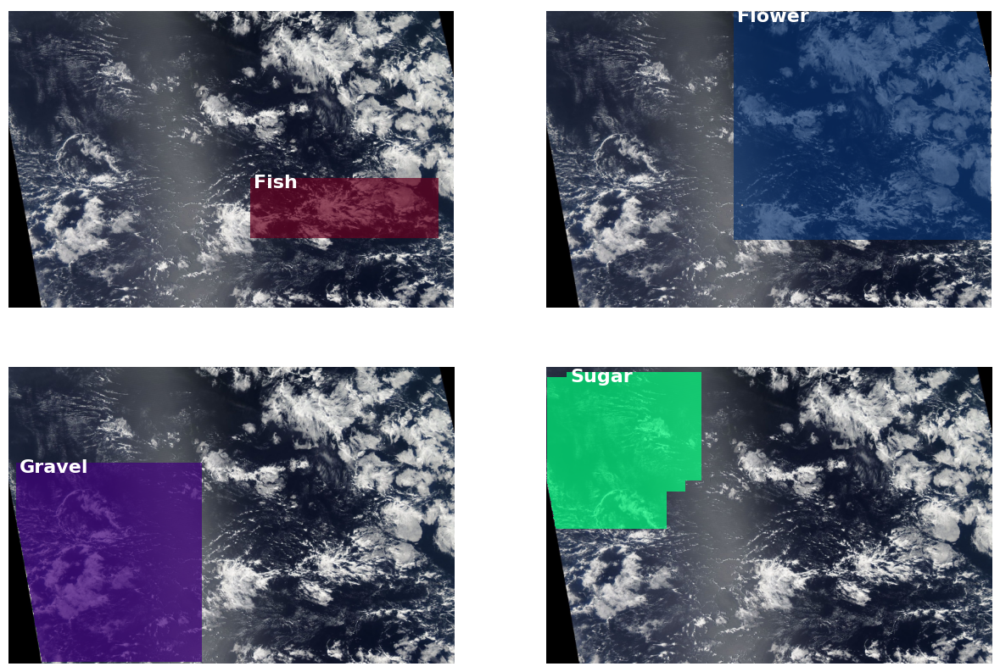

In [ ]:
image_id = os.listdir(train_image_path)[INDEX]
masks = get_masks_by_img_id(train_df, image_id)
masks = (masks[:,:,0], masks[:,:,1],masks[:,:,2],masks[:,:,3])

path = os.path.join(train_image_path,image_id)
img = cv2.imread(path)
img =  cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
colormaps = ['PuRd_r', 'Blues_r', 'Purples_r','winter_r'] # colormap_r = inverse colormap
mask_labels = ['Fish', 'Flower', 'Gravel', 'Sugar']
plt.figure(figsize=(15,10))
for i,(mask,cmap,label)in enumerate(zip(masks,colormaps,mask_labels)):
    mask = np.clip(mask,0,1)
    mask = np.ma.masked_where(mask == 0, mask)
    ax = plt.subplot(2,2, i+1)
    plt.imshow(img)
    plt.imshow(mask,alpha=0.7,cmap=cmap)
    draw_label_on_mask(mask,label)
    plt.axis("off")
    #cv2.imwrite(f"{label}.jpg",cv2.cvtColor(img, cv2.COLOR_RGB2BGR))

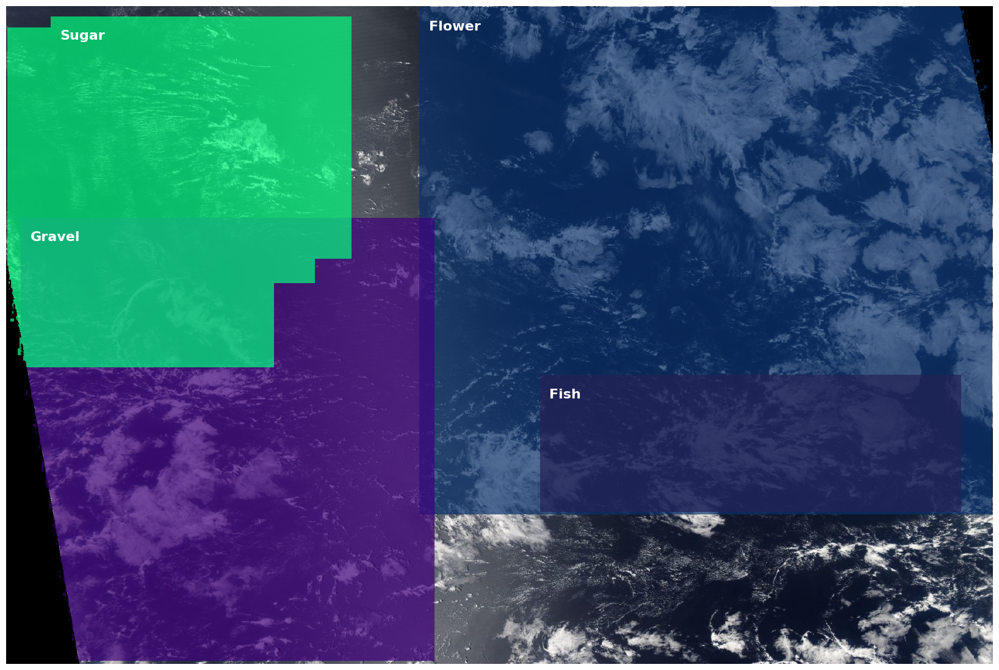

In [ ]:
image_id = os.listdir(train_image_path)[INDEX]
masks = get_masks_by_img_id(train_df, image_id)
masks = (masks[:,:,0], masks[:,:,1],masks[:,:,2],masks[:,:,3])

path = os.path.join(train_image_path,image_id)
img = cv2.imread(path)
img =  cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

colormaps = ['PuRd_r', 'Blues_r', 'Purples_r','winter_r']
mask_labels = ['Fish', 'Flower', 'Gravel', 'Sugar']
dpi = 100
plt.figure(figsize=(img_width/dpi, img_height/dpi), dpi=dpi)
plt.imshow(img)
for i,(mask,cmap,label) in enumerate(zip(masks,colormaps,mask_labels)):
    mask = np.clip(mask,0,1)
    mask = np.ma.masked_where(mask == 0, mask)
    plt.imshow(mask,alpha=0.7,cmap=cmap) # colormap_r = inverse colormap
    draw_label_on_mask(mask,label)
    plt.axis("off")
#plt.savefig(f"{work_dir}cloud_masks.png",transparent=True,bbox_inches='tight', pad_inches=0)

(2, 21, 734, 748)


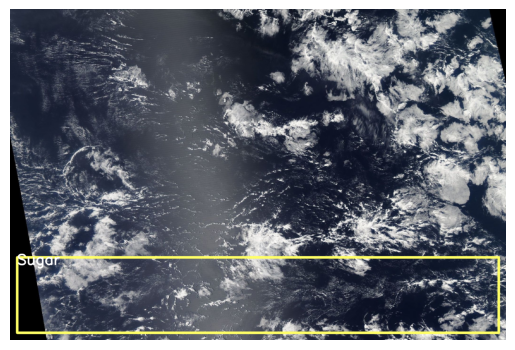

In [ ]:
image_id = os.listdir(train_image_path)[INDEX]
path = os.path.join(train_image_path,image_id)
img = cv2.imread(path)
img =  cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
masks = get_masks_by_img_id(train_df, image_id)
label = "Sugar"
mask = masks[:,:,label_to_idx[label]]
mask = np.clip(mask,0,1)
mask = np.ma.masked_where(mask == 0, mask)
bbox = cv2.boundingRect(mask.astype(np.uint8))
print(bbox)
bbox = (30, 1050, 2040, 320)
cv2.rectangle(img, bbox, label_to_rgb_color[label], 10)
cv2.putText(img, label, (bbox[0], bbox[1] + 30),
                    cv2.FONT_HERSHEY_SIMPLEX, 2.0, (255,255,255), 6)
#dpi = 100
#plt.figure(figsize=(img_width/dpi, img_height/dpi), dpi=dpi)
plt.imshow(img)
#draw_label_on_mask(mask,label)
plt.axis('off');
#plt.savefig(f"{work_dir}{label}_cloud_bbox.png",transparent=True,bbox_inches='tight', pad_inches=0)

In [ ]:
import cv2
import numpy as np
import matplotlib

def show_bounding_boxes(image, mask, labels, colors):
    """Shows the bounding boxes surrounding the polygon in the image, and
    adds labels to the bounding boxes.

    Args:
    image: The image.
    mask: The binary polygon mask.
    labels: The labels of the objects in the mask.
    colors: A list of colors to use for the bounding boxes.

    Returns:
    The image with the bounding boxes and labels drawn on it.
    """

    # Find the bounding boxes of the polygon.
    bounding_boxes = []
    for i in range(mask.shape[-1]):
        bbox = cv2.boundingRect(mask[:, :, i])
        bounding_boxes.append(bbox)

    # Draw the bounding boxes on the image.
    for bbox, label, color_name in zip(bounding_boxes, labels, colors):
        #rgb_color = matplotlib.colors.to_rgb(color_name)
        #rgb_color = tuple(value * 255 for value in rgb_color)
        rgb_color= color_name
        cv2.rectangle(image, bbox, rgb_color, 7)
        cv2.putText(image, label, (bbox[0], bbox[1] + 30),
                    cv2.FONT_HERSHEY_SIMPLEX, 1.3, (255,255,255), 4)

    return image

In [ ]:
rgb_color = matplotlib.colors.to_rgb('darkblue')
rgb_color = tuple(value * 255 for value in rgb_color)
rgb_color

(0.0, 0.0, 139.0)

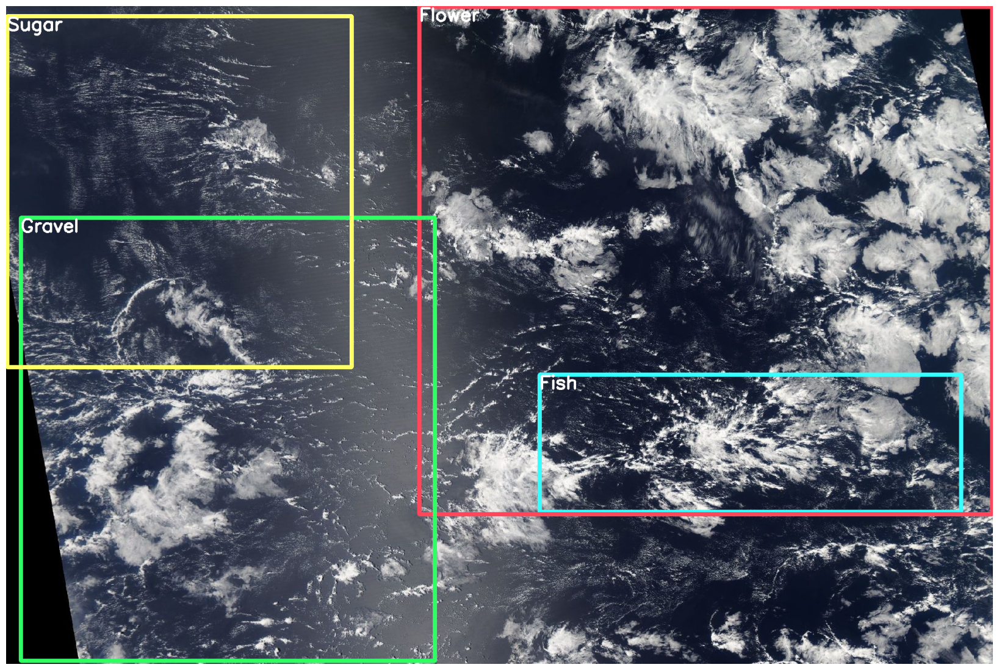

In [ ]:
image_id = os.listdir(train_image_path)[INDEX]
masks = get_masks_by_img_id(train_df, image_id)
masks = masks.astype(np.uint8)


path = os.path.join(train_image_path,image_id)
img = cv2.imread(path)
img =  cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

colors = ['maroon', 'darkblue', 'purple','teal']
rgb_colors = [(56, 255, 255),(255, 70, 90),(48, 255, 99),(255, 255, 102)]
labels = ['Fish', 'Flower', 'Gravel', 'Sugar']

img = show_bounding_boxes(img,masks,labels,rgb_colors)

dpi = 100
plt.figure(figsize=(img_width/dpi, img_height/dpi), dpi=dpi)
#plt.figure(figsize=(32,8))
plt.imshow(img)
plt.axis("off");
#plt.savefig(f"{work_dir}All_bbox.png",transparent=True,bbox_inches='tight', pad_inches=0)

In [ ]:
def show_img_with_masks(img,masks,comment=""):

    colormaps = ['PuRd_r', 'Blues_r', 'Purples_r','winter_r']
    mask_labels = ['Fish', 'Flower', 'Gravel', 'Sugar']

    fig, axes = plt.subplots(1,6,figsize=(36,4))
    axes = axes.ravel()

    if img.shape[-1]!=3:
        img_cmap = 'gray'
    else:
        img_cmap=None

    for ix,axis in enumerate(axes):
        ix = ix%6
        axis.imshow(img,cmap=img_cmap)
        axis.axis('off')
        if ix==0:
            axis.set_title("Main Image")
        elif ix==1:
            for i,(mask,cmap,label) in enumerate(zip(masks,colormaps,mask_labels)):
                mask = np.clip(mask,0,1)
                mask = np.ma.masked_where(mask == 0, mask)
                axis.imshow(mask,alpha=0.7,cmap=cmap)
                axis.set_title(f"All the mask {comment}")
                draw_label_on_mask(mask,label,axis)
        elif ix>=2:
            for i,(mask,cmap,label) in enumerate(zip(masks,colormaps,mask_labels)):
                mask = np.clip(mask,0,1)
                mask = np.ma.masked_where(mask == 0, mask)
                axis = axes[2+i]
                axis.imshow(mask,alpha=0.4,cmap=cmap)
                axis.set_title(f"{label} {comment}")
                draw_label_on_mask(mask,label,axis)
    plt.show()

    return None

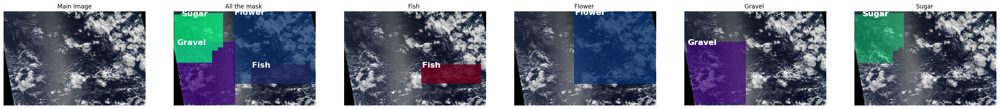

In [ ]:
image_id = os.listdir(train_image_path)[INDEX]
path = os.path.join(train_image_path,image_id)
img = cv2.imread(path)
img =  cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
masks = get_masks_by_img_id(train_df, image_id)
masks = (masks[:,:,0], masks[:,:,1],masks[:,:,2],masks[:,:,3])
show_img_with_masks(img,masks)

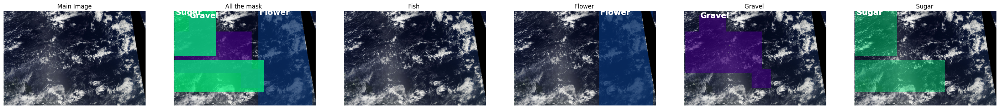

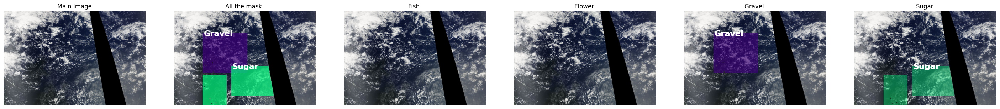

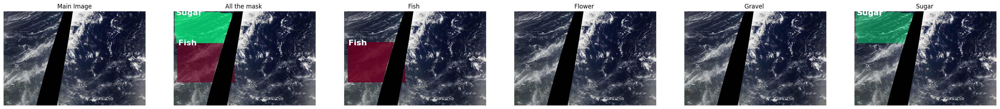

In [ ]:
image_ids = os.listdir(train_image_path)[13:16]
for image_id in image_ids:
    path = os.path.join(train_image_path,image_id)
    img = cv2.imread(path)
    img =  cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    masks = get_masks_by_img_id(train_df, image_id)
    masks = (masks[:,:,0], masks[:,:,1],masks[:,:,2],masks[:,:,3])
    show_img_with_masks(img,masks)

In [ ]:
import numpy as np
import pandas as pd
import cv2
import os
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model


In [ ]:
def unet_model(input_size=(256, 256, 3)):
    inputs = Input(input_size)
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)

    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)

    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)

    c4 = Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    c4 = Conv2D(512, (3, 3), activation='relu', padding='same')(c4)
    p4 = MaxPooling2D((2, 2))(c4)

    c5 = Conv2D(1024, (3, 3), activation='relu', padding='same')(p4)
    c5 = Conv2D(1024, (3, 3), activation='relu', padding='same')(c5)

    u6 = UpSampling2D((2, 2))(c5)
    u6 = concatenate([u6, c4])
    c6 = Conv2D(512, (3, 3), activation='relu', padding='same')(u6)
    c6 = Conv2D(512, (3, 3), activation='relu', padding='same')(c6)

    u7 = UpSampling2D((2, 2))(c6)
    u7 = concatenate([u7, c3])
    c7 = Conv2D(256, (3, 3), activation='relu', padding='same')(u7)
    c7 = Conv2D(256, (3, 3), activation='relu', padding='same')(c7)

    u8 = UpSampling2D((2, 2))(c7)
    u8 = concatenate([u8, c2])
    c8 = Conv2D(128, (3, 3), activation='relu', padding='same')(u8)
    c8 = Conv2D(128, (3, 3), activation='relu', padding='same')(c8)

    u9 = UpSampling2D((2, 2))(c8)
    u9 = concatenate([u9, c1])
    c9 = Conv2D(64, (3, 3), activation='relu', padding='same')(u9)
    c9 = Conv2D(64, (3, 3), activation='relu', padding='same')(c9)

    outputs = Conv2D(4, (1, 1), activation='sigmoid')(c9)

    model = Model(inputs=[inputs], outputs=[outputs])
    model.compile(optimizer=Adam(learning_rate=1e-4), loss='binary_crossentropy', metrics=['accuracy'])

    return model


In [ ]:
class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, image_dir, mask_df, batch_size=64, img_height=256, img_width=256, num_classes=4):
        self.image_dir = image_dir
        self.mask_df = mask_df
        self.batch_size = batch_size
        self.img_height = img_height
        self.img_width = img_width
        self.num_classes = num_classes
        self.image_ids = self.mask_df['Image_Id'].unique()
        self.on_epoch_end()

    def __len__(self):
        return int(np.floor(len(self.image_ids) / self.batch_size))

    def __getitem__(self, index):
        batch_image_ids = self.image_ids[index*self.batch_size:(index+1)*self.batch_size]
        X, y = self.__data_generation(batch_image_ids)
        return X, y

    def on_epoch_end(self):
        pass

    def __data_generation(self, batch_image_ids):
        X = np.empty((self.batch_size, 256, 256, 3))  # Assuming 3-channel input (RGB)
        y = np.empty((self.batch_size, 256, 256, self.num_classes))  # num_classes for multi-class segmentation

        for i, image_id in enumerate(batch_image_ids):
            img = cv2.imread(os.path.join(self.image_dir, image_id))
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = cv2.resize(img, (256, 256))
            X[i] = img / 255.0

            masks = get_masks_by_img_id(self.mask_df, image_id)
            for j in range(self.num_classes):
                mask_resized = cv2.resize(masks[:, :, j], (256, 256))
                y[i, :, :, j] = mask_resized

        return X, y



In [ ]:
train_gen = DataGenerator(train_image_path, train_df, batch_size=32, img_height=256, img_width=256, num_classes=4)

model = unet_model(input_size=(256, 256, 3))
model.summary()
plot_model(model, to_file='model_architecture.png', show_shapes=True)

history = model.fit(train_gen, epochs=20, verbose=1)
model.save('cloud_segmentation_model.h5')



Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_19 (Conv2D)  │ (None, 256, 256,  │      1,792 │ input_layer_1[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_20 (Conv2D)  │ (None, 256, 256,  │     36,928 │ conv2d_19[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 128, 128,  │          0 │ conv2d_20[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_21 (Conv2D)  │ (None, 128, 128,  │     73,856 │ max_pooling2d_4[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_22 (Conv2D)  │ (None, 128, 128,  │    147,584 │ conv2d_21[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_5     │ (None, 64, 64,    │          0 │ conv2d_22[0][0]   │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_23 (Conv2D)  │ (None, 64, 64,    │    295,168 │ max_pooling2d_5[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_24 (Conv2D)  │ (None, 64, 64,    │    590,080 │ conv2d_23[0][0]   │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_6     │ (None, 32, 32,    │          0 │ conv2d_24[0][0]   │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_25 (Conv2D)  │ (None, 32, 32,    │  1,180,160 │ max_pooling2d_6[… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_26 (Conv2D)  │ (None, 32, 32,    │  2,359,808 │ conv2d_25[0][0]   │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_7     │ (None, 16, 16,    │          0 │ conv2d_26[0][0]   │
│ (MaxPooling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_27 (Conv2D)  │ (None, 16, 16,    │  4,719,616 │ max_pooling2d_7[… │
│                     │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_28 (Conv2D)  │ (None, 16, 16,    │  9,438,208 │ conv2d_27[0][0]   │
│                     │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_4     │ (None, 32, 32,    │          0 │ conv2d_28[0][0]   │
│ (UpSampling2D)      │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_4       │ (None, 32, 32,    │          0 │ up_sampling2d_4[

 Total params: 31,379,140 (119.70 MB)

 Trainable params: 31,379,140 (119.70 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


173/173 ━━━━━━━━━━━━━━━━━━━━ 1225s 7s/step - accuracy: 0.3201 - loss: 0.4715
Epoch 2/20
173/173 ━━━━━━━━━━━━━━━━━━━━ 1272s 7s/step - accuracy: 0.2927 - loss: 0.3895
Epoch 3/20
173/173 ━━━━━━━━━━━━━━━━━━━━ 1166s 6s/step - accuracy: 0.3623 - loss: 0.3481
Epoch 4/20
173/173 ━━━━━━━━━━━━━━━━━━━━ 1165s 6s/step - accuracy: 0.4296 - loss: 0.3310
Epoch 5/20
173/173 ━━━━━━━━━━━━━━━━━━━━ 1175s 7s/step - accuracy: 0.4723 - loss: 0.3182
Epoch 6/20
173/173 ━━━━━━━━━━━━━━━━━━━━ 1191s 7s/step - accuracy: 0.4876 - loss: 0.3175
Epoch 7/20
173/173 ━━━━━━━━━━━━━━━━━━━━ 1151s 6s/step - accuracy: 0.4780 - loss: 0.3080
Epoch 8/20
173/173 ━━━━━━━━━━━━━━━━━━━━ 1192s 7s/step - accuracy: 0.4915 - loss: 0.3013
Epoch 9/20
173/173 ━━━━━━━━━━━━━━━━━━━━ 1225s 7s/step - accuracy: 0.4663 - loss: 0.3042
Epoch 10/20
173/173 ━━━━━━━━━━━━━━━━━━━━ 1123s 6s/step - accuracy: 0.5012 - loss: 0.2893
Epoch 11/20
173/173 ━━━━━━━━━━━━━━━━━━━━ 999s 6s/step - accuracy: 0.5063 - loss: 0.2911
Epoch 12/20
173/173 ━━━━━━━━━━━━━━━━━━━━ 1

In [ ]:
from tensorflow.keras.models import load_model
image_path = "../input/haaaaaa/hasi.jpg"
model = load_model('cloud_segmentation_model.h5')

# Use the model to predict
def predict(image_path):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (256, 256))
    img = img / 255.0
    img = np.expand_dims(img, axis=0)
    pred_mask = model.predict(img)[0]
    return pred_mask


In [ ]:
from tensorflow.keras.models import load_model
import cv2
import numpy as np

# Corrected image path in Colab environment
image_path = "../input/haaaaaa/hasi.jpg"  # Make sure the image is uploaded to this path
model = load_model('cloud_segmentation_model.h5')

# Use the model to predict
def predict(image_path):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (256, 256))
    img = img / 255.0
    img = np.expand_dims(img, axis=0)
    pred_mask = model.predict(img)[0]
    return pred_mask

# Call the function to predict
predicted_mask = predict(image_path)
print(predicted_mask)


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
[[[5.63013479e-02 3.76828499e-02 1.36056617e-01 1.43723175e-01]
  [3.39482203e-02 1.29096219e-02 1.33132115e-01 1.37844115e-01]
  [2.19918210e-02 5.71463024e-03 1.03175953e-01 1.41958922e-01]
  ...
  [2.81293113e-02 1.33952051e-02 2.14486234e-02 9.24350414e-03]
  [5.32208867e-02 1.99405439e-02 3.25383097e-02 1.83483288e-02]
  [1.10029101e-01 4.53439429e-02 8.34301636e-02 6.04140498e-02]]

 [[2.69980114e-02 1.19781280e-02 9.81147140e-02 1.44848108e-01]
  [1.96258165e-02 4.47453791e-03 1.24911413e-01 1.94520921e-01]
  [1.59603413e-02 2.56688241e-03 1.38518468e-01 2.07217857e-01]
  ...
  [2.06827857e-02 1.18180644e-02 2.43177358e-02 9.84511804e-03]
  [2.96229534e-02 1.21478289e-02 2.45743264e-02 1.20398365e-02]
  [5.26658446e-02 1.98329110e-02 3.66609618e-02 2.57878937e-02]]

 [[1.81967672e-02 5.75023843e-03 9.51997489e-02 1.59807205e-01]
  [1.50623107e-02 2.62018456e-03 1.41615331e-01 2.15674147e-01]
  [1.38022816e-02 1.87223824e-03 1.66075930e-01 2.70

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 664ms/step


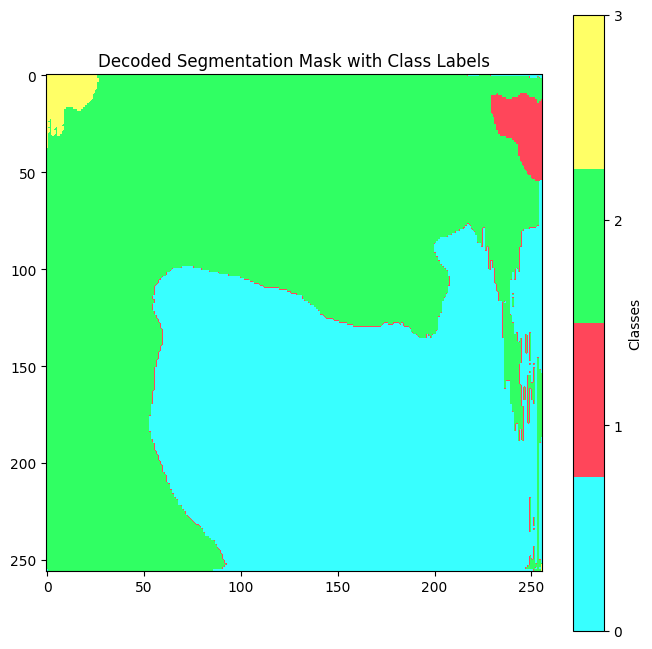

Class 0: Fish
 - Color: maroon
 - RGB Color: (56, 255, 255)
 - Colormap: PuRd_r
Class 1: Flower
 - Color: darkblue
 - RGB Color: (255, 70, 90)
 - Colormap: Blues_r
Class 2: Gravel
 - Color: purple
 - RGB Color: (48, 255, 99)
 - Colormap: Purples_r
Class 3: Sugar
 - Color: teal
 - RGB Color: (255, 255, 102)
 - Colormap: winter_r


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from tensorflow.keras.models import load_model

# Provided mappings
indexes = [0, 1, 2, 3]
labels = ['Fish', 'Flower', 'Gravel', 'Sugar']
colors = ['maroon', 'darkblue', 'purple', 'teal']
colormaps = ['PuRd_r', 'Blues_r', 'Purples_r', 'winter_r']
rgb_colors = [(56, 255, 255), (255, 70, 90), (48, 255, 99), (255, 255, 102)]

label_to_idx = dict(zip(labels, indexes))
idx_to_label = dict(zip(indexes, labels))
label_to_color = dict(zip(labels, colors))
idx_to_color = dict(zip(indexes, colors))
label_to_rgb_color = dict(zip(labels, rgb_colors))
idx_to_rgb_color = dict(zip(indexes, rgb_colors))
label_to_colormap = dict(zip(labels, colormaps))
idx_to_colormap = dict(zip(indexes, colormaps))

# Load your saved model
model = load_model('cloud_segmentation_model.h5')

# Load and preprocess the input image
def load_and_preprocess_image(image_path):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB
    img = cv2.resize(img, (256, 256))  # Resize to match model input size
    img = img / 255.0  # Normalize pixel values
    img = np.expand_dims(img, axis=0)  # Add batch dimension
    return img

# Make predictions using the model
def predict(image_path):
    img = load_and_preprocess_image(image_path)
    pred_mask = model.predict(img)[0]  # Predict the mask
    return pred_mask

# Decode the predicted mask to assign each pixel a class
def decode_prediction(pred_mask):
    decoded_mask = np.argmax(pred_mask, axis=-1)  # Get class with highest probability
    return decoded_mask

# Path to your input image
image_path = '../input/haaaaaa/hasi.jpg'  # Change this to your actual image path

# Predict the mask
pred_mask = predict(image_path)

# Decode the predicted mask
decoded_mask = decode_prediction(pred_mask)

# Define a custom color map for the segmentation mask using the RGB values
def create_custom_cmap(rgb_colors):
    custom_colors = [tuple([c / 255 for c in color]) for color in rgb_colors]
    return mcolors.ListedColormap(custom_colors)

# Create a custom color map using the provided RGB colors
custom_cmap = create_custom_cmap(rgb_colors)

# Plot the decoded mask using the custom color map
plt.figure(figsize=(8, 8))
plt.imshow(decoded_mask, cmap=custom_cmap)
plt.colorbar(ticks=indexes, label='Classes')
plt.title("Decoded Segmentation Mask with Class Labels")
plt.show()

# Display class label, color, and colormap information
for idx in indexes:
    label = idx_to_label[idx]
    color = idx_to_color[idx]
    rgb_color = idx_to_rgb_color[idx]
    colormap = idx_to_colormap[idx]
    print(f"Class {idx}: {label}")
    print(f" - Color: {color}")
    print(f" - RGB Color: {rgb_color}")
    print(f" - Colormap: {colormap}")


In [ ]:
import numpy as np
from collections import Counter

# Assuming 'decoded_mask' is your predicted mask with the label index at each pixel

# Function to find the most frequent labels
def find_most_frequent_labels(decoded_mask, idx_to_label, top_n=1):
    # Flatten the decoded mask to 1D and count occurrences of each label
    flat_mask = decoded_mask.flatten()
    label_counts = Counter(flat_mask)

    # Get the top 'n' most frequent labels
    most_frequent_labels = label_counts.most_common(top_n)

    # Convert label indices to label names
    frequent_label_names = [idx_to_label[label_idx] for label_idx, _ in most_frequent_labels]

    return frequent_label_names, most_frequent_labels

# Decode the predicted mask if not already done
# decoded_mask = decode_prediction(pred_mask)  # Uncomment if pred_mask is present

# Find the top 2 most frequent labels (or change top_n as per your need)
most_frequent_labels, label_frequencies = find_most_frequent_labels(decoded_mask, idx_to_label, top_n=2)

# Display the result
print(f"Most Frequent Label Names: {most_frequent_labels}")
print(f"Label Frequencies: {label_frequencies}")


Most Frequent Label Names: ['Gravel', 'Fish']
Label Frequencies: [(2, 36752), (0, 27462)]
